In [2]:
# imports from custom library
import sys
sys.path.append('../../')
import matplotlib.pyplot as plt
from mlrefined_libraries import superlearn_library as superlearn
from mlrefined_libraries import calculus_library as callib
from mlrefined_libraries import math_optimization_library as optlib
import autograd.numpy as np
import math
import pandas as pd
from mlrefined_libraries import calculus_library as calclib

%matplotlib notebook

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Linear Supervised Learning Series

# Part 1: Linear regression

In this post we formally describe the problem of *linear regression*, or the fitting of a representative line (or hyperplane in higher dimensions) to a set of input/output data points.  

Regression in general may be performed for a variety of reasons: to produce a so-called trend line (or - more generally - a curve) that can be used to help visually summarize, drive home a particular point about the data under study, or to learn a model so that precise predictions can be made regarding output values in the future.

Press the button 'Toggle code' below to toggle code on and off for entire this presentation.

In [3]:
from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is eåxported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)

Toggle code

# 1.  Linear regression

With linear regression we aim to fit a line (or hyperplane in higher dimensions) to a scattering of data. In this Section we describe the fundamental concepts underlying this procedure. 

## 1.1  Notation and modeling

Data for regression problems comes in the form of a set of $P$ input/output observation pairs

\begin{equation}
 \left(\mathbf{x}_{1},y_{1}\right),\,\left(\mathbf{x}_{2},y_{2}\right),\,...,\,\left(\mathbf{x}_{P},y_{P}\right)
\end{equation}

or $\left\{ \left(\mathbf{x}_{p},y_{p}\right)\right\} _{p=1}^{P}$ for short, where $\mathbf{x}_{p}$ and $y_{p}$ denote the $p^{\textrm{th}}$ input and output respectively.

In simple instances the input is scalar-valued (the output will always be considered scalar-valued here)

Hence the linear regression problem is geometrically speaking one of fitting a line to the associated scatter of data points in 2-dimensional space.  

In general however each input $\mathbf{x}_{p}$ may be a column vector of length $N$

\begin{equation}
\mathbf{x}_{p}=\left[\begin{array}{c}
x_{1,p}\\
x_{2,p}\\
\vdots\\
x_{N,p}
\end{array}\right]
\end{equation}

in which case the linear regression problem is analogously one of fitting a hyperplane to a scatter of points in $N+1$ dimensional space. 


<p><img src= '../../mlrefined_images/superlearn_images/Fig_3_1_new.png' width="85%" height="auto" alt=""/></p>

In the case of scalar input we fit a line to the data requiring we determine a vertical intercept $w_0$ and slope $w_1$ so ideally that 

\begin{equation}
w_{0}+x_{p}w_{1}\approx y_{p},\quad p=1,...,P.
\end{equation}

More generally, when dealing with $N$ dimensional input we have a bias and $N$ associated slope weights to tune properly in order to fit a hyperplane so ideally

\begin{equation}
w_{0}+ x_{1,p}w_{1} + x_{2,p}w_{2} + \cdots + x_{N,p}w_{N} \approx y_{p} ,\quad p=1,...,P.
\end{equation}

For any $N$ we can write the general case more compactly denoting

\begin{equation}
\mathbf{w}=\left[\begin{array}{c}
w_{1}\\
w_{2}\\
\vdots\\
w_{N}
\end{array}\right]
\end{equation}

as

\begin{equation}
w_0+\mathbf{x}_{p}^T\mathbf{w} \approx y_{p} ,\quad p=1,...,P.
\end{equation}

## 1.2  The Least Squares cost function

To find the parameters of the hyperplane which best fits a regression dataset, it is common practice to first form the *Least Squares cost function*.

For a given set of parameters $\mathbf{w}$ this cost function computes the total squared error between the associated hyperplane and the data (as illustrated pictorially in the Figure below).

<p><img src= '../../mlrefined_images/superlearn_images/Least_Squares.png' width="80%" height="auto" alt=""/></p>

  Naturally then the best fitting hyperplane is the one whose parameters minimize this error.

We want to find a weight vector $\mathbf{w}$ and the bias $w_0$ so that each of $P$ approximate equalities

\begin{equation}
w_0+\mathbf{x}_{p}^T\mathbf{w} \approx y_{p}
\end{equation}

holds as well as possible.

 Another way of stating the above is to say that the *error* between $w_0+\mathbf{x}_{p}^{T}\mathbf{w}$ and $y_{p}$ is small.  One natural way to measure error between two quantities like this is simply to square their difference as 

\begin{equation}
\left(w_0+\mathbf{x}_{p}^{T}\mathbf{w} - y_{p}^{\,}\right)^2
\end{equation}

Since we want all $P$ such values to be small we can sum them up - forming the *Least Squares* cost function for linear regression

\begin{equation}
\,g\left(w_0,\mathbf{w}\right)=\sum_{p=1}^{P}\left(w_0+\mathbf{x}_{p}^{T}\mathbf{w}-y_{p}^{\,}\right)^{2}
\end{equation}

We want to determine a value for the pair $w_0$ and $\mathbf{w}$ that *minimizes* $g\left(w_0,\mathbf{w}\right)$, or written formally we want to solve the unconstrained problem

\begin{equation}
\underset{w_0,\,\mathbf{w}}{\mbox{minimize}}\,\,\underset{p=1}{\overset{P}{\sum}}\left(w_0+\mathbf{x}_{p}^{T}\mathbf{w}-y_{p}^{\,}\right)^{2}
\end{equation}

## 1.3  Minimization of the Least Squares cost function

As discussed in our *mathematical optimization series*, generally speaking determining the overall shape of a function - i.e., whether or not a function is convex - helps determine the appropriate optimization method(s) we can apply to efficiently determine the ideal parameters. 

In the case of the Least Squares cost function for linear regression it is easy to check that *the cost function is always convex regardless of the dataset*.  

#### <span style="color:#a50e3e;">Example 2: </span> Visually verifying the convexity of the cost function for a toy dataset

In this example we plot the contour and surface plot for the Least Squares cost function for linear regression for a toy dataset.   

<IPython.core.display.Javascript object>


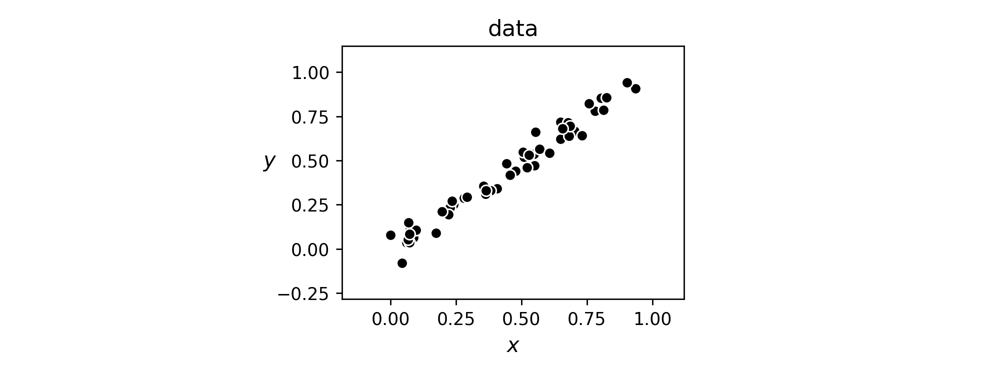

In [6]:
# load in dataset
datapath = '../../mlrefined_datasets/superlearn_datasets/2d_linregress_data.csv'
data = np.asarray(pd.read_csv(datapath,header = None))

# create instance of linear regression demo, used below and in the next examples
demo1 = superlearn.lin_regression_demos.Visualizer(data)

# plot dataset
demo1.plot_data()

The contour plot and corresponding surface generated by the Least Squares cost function using this data are shown below.  

<IPython.core.display.Javascript object>


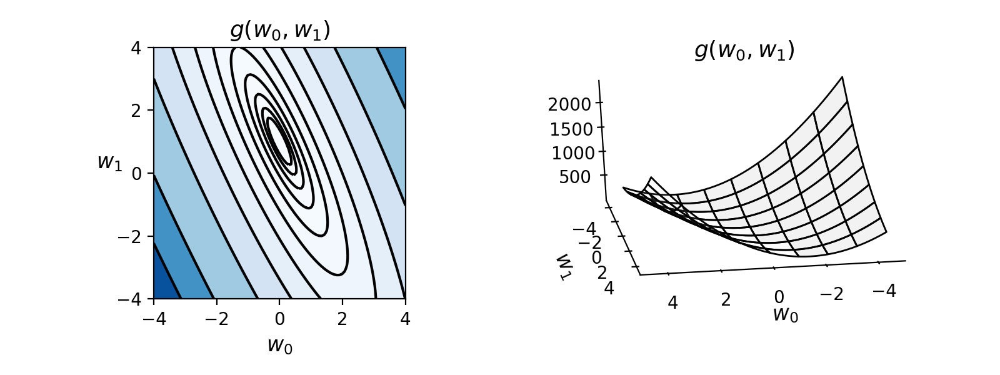

In [3]:
# demo.center_data()
demo1.plot_ls_cost(view = [30,80],viewmax = 4,num_contours = 30)

- the elliptical contours and 'upward bending' shape of the surface indeed confirms the function's convexity 

> The Least Squares cost function for linear regression is always convex regardless of the input dataset, hence we can easily apply either gradient descent or Newton's method in order to minimize it.

#### <span style="color:#a50e3e;">Example 3: </span> Using gradient descent to minimize the Least Squares cost on our toy dataset

The simplest way to code up gradient descent in the same manner as shown above is to simply take the generic unnormalized gradient descent Python code provided in Part 2 of our *series on mathematical optimization*, and simply plug in the Least Squares cost function. 

Here the automatic differentiator [autograd](https://github.com/HIPS/autograd) is used to efficiently compute the gradient at each step. One can implement the cost function in Python as shown in the next Python cell.

In [7]:
# an implementation of the least squares cost function for linear regression for N = 2 input dimension datasets
x = data[:,0]    # define input of dataset prior to function definition
y = data[:,1]    # define output of dataset prior to function definition
def least_squares(w):
    cost = 0
    for p in range(0,len(y)):
            cost +=(w[0] + w[1]*x[p] - y[p])**2
    return cost

Note that because autograd will differentiate with respect to any input to a Python function, officially the only input here can be the weights ```w```.  

The input/output data ```x``` and ```y``` should be loaded in prior to defining the function, so that they are included in the scope of the Least Squares implementation, but treated as weights by autograd. 

In [5]:
# test out a set of weights using our implementation of the N = 2 least squares function
w = [0,1]
least_squares(w)

0.11438129466751287

To deal with arbitrary input dimension $N$ one then only needs to replace the cost update inside the for loop, i.e., ```cost +=(w[0] + w[1]*x[p] - y[p])**2```, with the more general form.

Alternatively one can 'hard code' the gradient, writing it out algebraically and implementing the same thing in code. Using the more compact notation

\begin{equation}
\widetilde{\mathbf{w}}=\left[\begin{array}{c}
w_{0}\\
\mathbf{w}
\end{array}\right]
\,\,\,\,\text{and}\,\,\,\,\,
\widetilde{\mathbf{x}}_{p}=\left[\begin{array}{c}
1\\
\mathbf{x}_{p}
\end{array}\right]
\end{equation}

one can easily compute the general form of the gradient by hand (using the derivative rules detailed in our *vital elements of calculus series*) to be

\begin{equation}
\nabla g\left(\widetilde{\mathbf{w}}\right) = 2\sum_{p=1}^{P} \widetilde{\mathbf{x}}_p^{\,}\left(\widetilde{\mathbf{x}}_p^T \widetilde{\mathbf{w}}_{\,}^{\,} - y_p^{\,}\right)
\end{equation}

In the next Python cell minimize the Least Squares cost using the toy dataset presented in Example 2.  

In particular since the function is convex we use unnormalized gradient descent, and employ a fixed steplength value $\alpha = 0.01$ for all 75 
steps until approximately reaching the minimum of the function.  

Here we employ the file ``optimizers.py`` which contains a short list of optimization algorithms discussed in our series on *mathematical optimization*, including gradient descent and Newton's method.

In [8]:
# declare an instance of our current our optimizers
opt = superlearn.optimimzers.MyOptimizers()

# run desired algo with initial point, max number of iterations, etc.,
w_hist = opt.gradient_descent(g = least_squares,w = np.asarray([-1.0,-2.0]),max_its = 75,alpha = 10**-2)

Now we animate the process of gradient descent run above.  

As you move the slider from left to right the gradient descent process animates, until completion when the slider is all the way to the right.

Simultaneously, in the left panel the corresponding linear model given by the weights at each step of gradient descent is drawn, while the point given by the weights is drawn on the Least Squares cost function contours in the right panel.


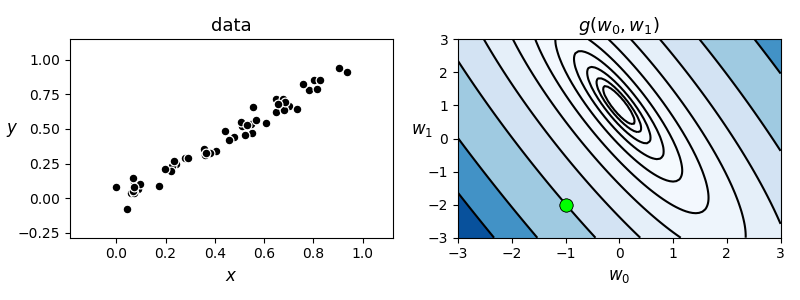
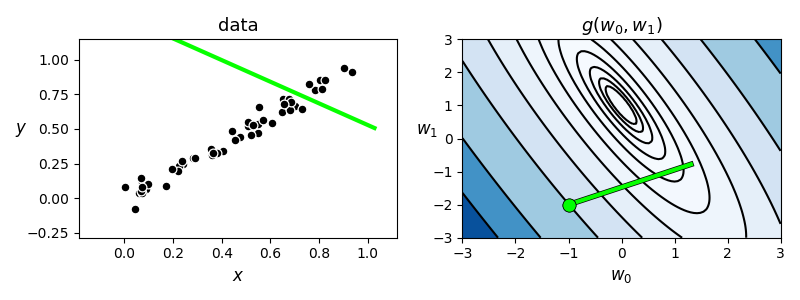
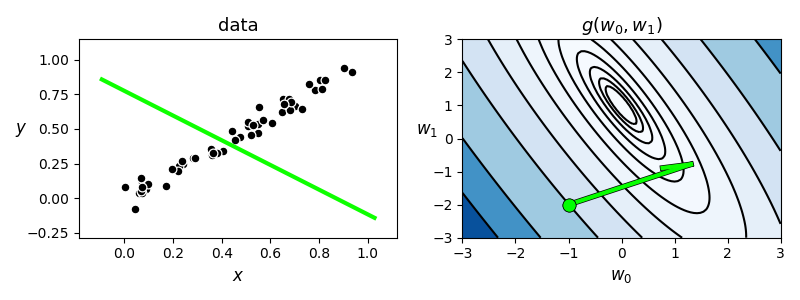
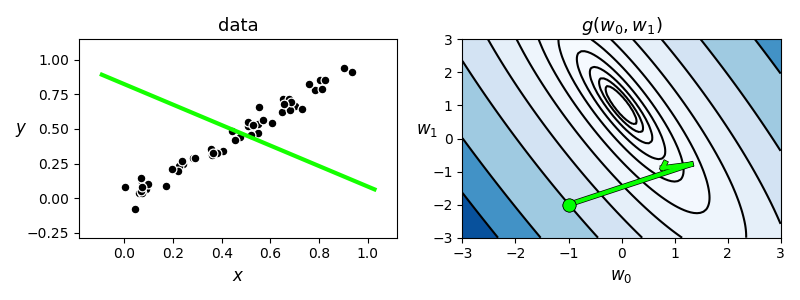
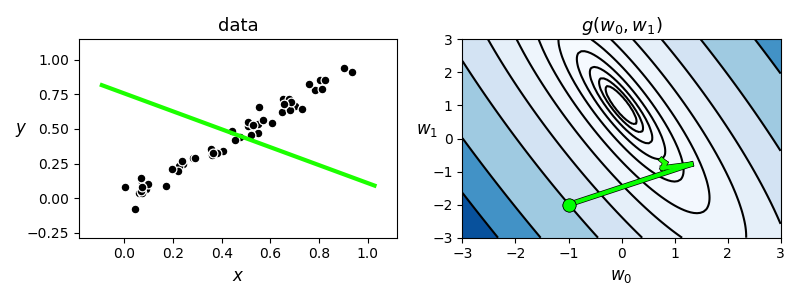
...
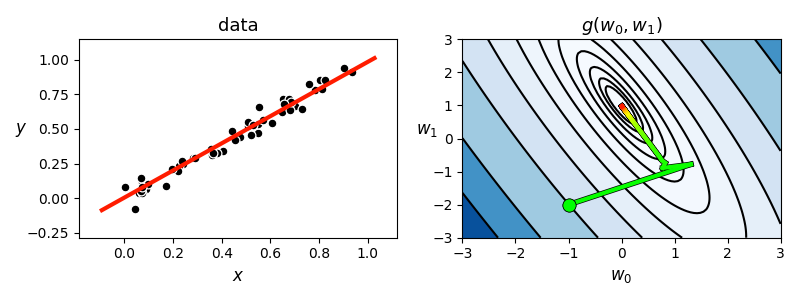
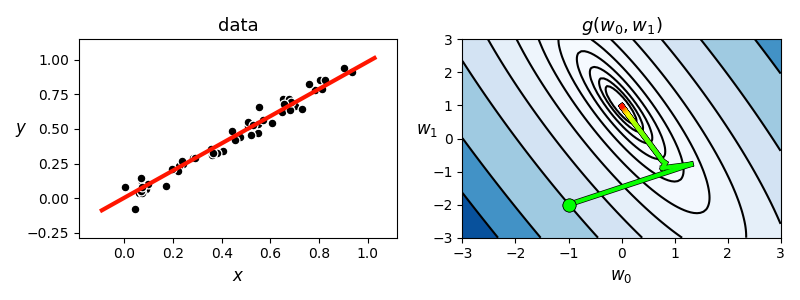
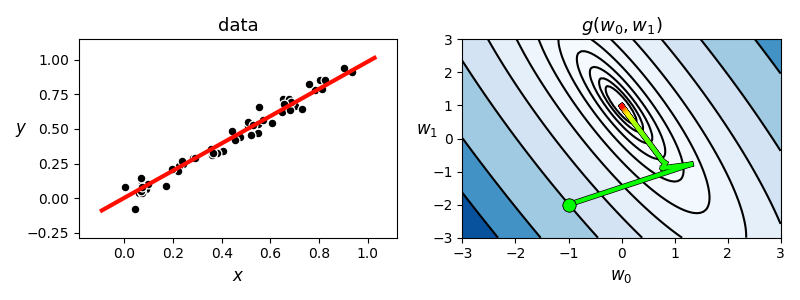
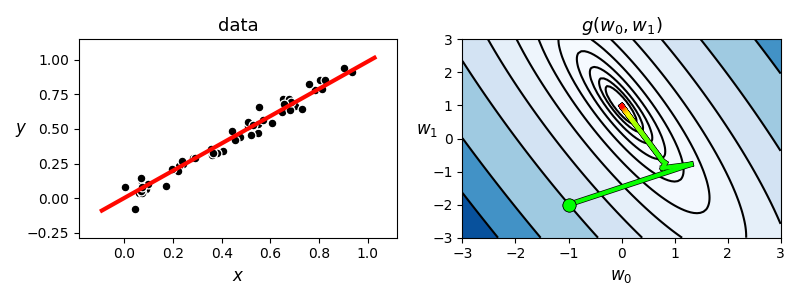
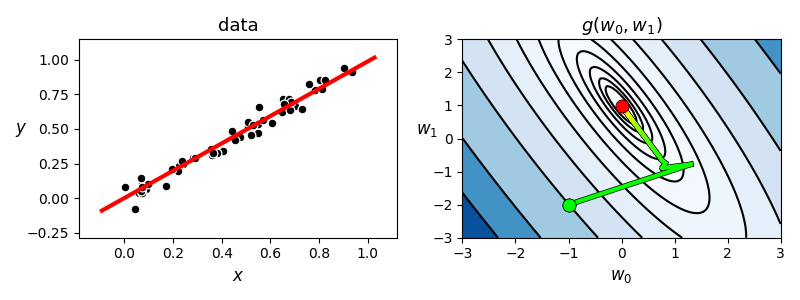

In [9]:
# animate descent process
demo1.animate_it_2d(w_hist,num_contours = 30)

#### <span style="color:#a50e3e;">Example 4: </span> Using Newton's method to minimize the Least Squares cost on our toy dataset

In Example 6 of our post on Newton's method in our *series on mathematical optimization* we described how Newton's method perfectly minimizes any quadratic function in a single step.  By re-writing it one can show that Least Squares cost function

$$
\,g\left(\widetilde{\mathbf{w}}\right)=\sum_{p=1}^{P}\left(\widetilde{\mathbf{x}}_{p}^{T}\widetilde{\mathbf{w}}-y_{p}^{\,}\right)^{2}
$$

with any dataset and any $N$, is always a quadratic function, hence Newton's method can be used to minimize it in a single step. Specifically, the cost function can be equivalently rewritten as 


$$
g(\widetilde{\mathbf{w}}) = \widetilde{\mathbf{w}}^T \mathbf{A}^{\,} \widetilde{\mathbf{w}} + \mathbf{b}^T \widetilde{\mathbf{w}} + c
$$

where 

\begin{equation}
\mathbf{A} = \sum_{p=1}^{P}\widetilde{\mathbf{x}}_{p}^{\,} \widetilde{\mathbf{x}}_{p}^T   \,\,\,\,\,\,\,\,\,\,\,\,\,\mathbf{b} = -2\sum_{p=1}^{P}\widetilde{\mathbf{x}}_{p}^{\,}y_p^{\,} \,\,\,\,\,\,\,\,\,\,\,\,\, c = \sum_{p=1}^{P}y_p^2
\end{equation}

We illustrate the fact that Newton's method can fit a linear regression in a single step below using the same setup as in the previous example, except Newton's method is now used instead of gradient descent.  Indeed it takes only a single step to reach the minimum of the cost, while simultaneously finding a set of weights that produces a perfectly fitting line.

In [10]:
# declare an instance of our current our optimizers
opt = superlearn.optimimzers.MyOptimizers()

# run desired algo with initial point, max number of iterations, etc.,
w_hist = opt.newtons_method(g = least_squares,w = np.asarray([-1.0,-2.0]),max_its = 1)


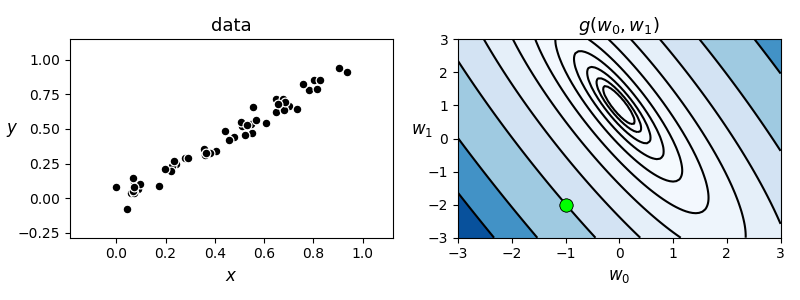
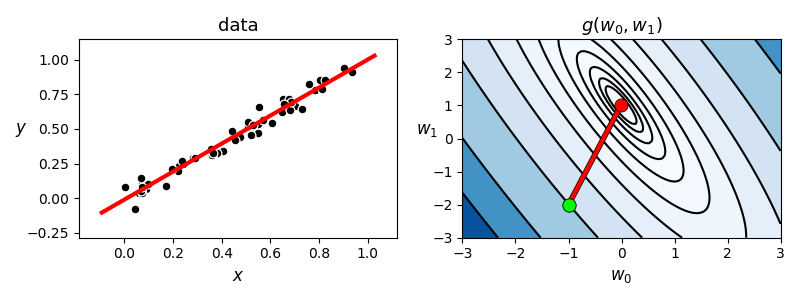

In [11]:
# animate descent process
demo1.animate_it_2d(w_hist,num_contours = 30)

As with gradient descent, one can repeat this experiment by taking the Newton's method code provided in our *series on mathematical optimization* - which also uses the autograd automatic differentiator - and simply plug in the Python implementation of the Least Squares cost function given in the previous example.

Alternatively if one wishes to write out the Newton step analytically it can be shown to reduce to the following system of linear equations

\begin{equation}
\left(\sum_{p=1}^{P} \widetilde{\mathbf{x}}_p^{\,}\widetilde{\mathbf{x}}_p^T \right) \widetilde{\mathbf{w}}_{\,}^{\,} =  \sum_{p=1}^{P} \widetilde{\mathbf{x}}_p^{\,} y_p^{\,}
\end{equation}

#### <span style="color:#a50e3e;">Example 5: </span> An example with input dimension $N=2$ 

In this example we look at another toy dataset with $N = 2$ inputs, which is plotted by the next Python cell.  This dataset consists of 50 data points taken randomly from the hyperplane $y = 1 - x_1 - x_2$ with the addition of a small amount of random Gaussian noise to their $y$ value.

<IPython.core.display.Javascript object>


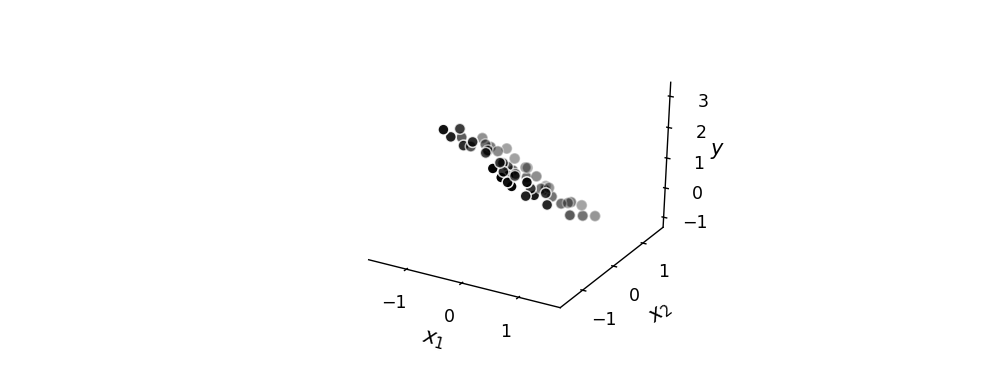

In [12]:
# load in dataset
datapath = '../../mlrefined_datasets/superlearn_datasets/3d_linregress_data.csv'
data = np.asarray(pd.read_csv(datapath,header = None))

# create instance of linear regression demo, used below and in the next examples
demo2 = superlearn.lin_regression_demos.Visualizer(data)

# plot dataset
demo2.plot_data()

To fit the Least Squares cost function we must re-define it to accept higher dimensional input.  We do this in the next Python cell.

In [11]:
# an implementation of the least squares cost function for linear regression for N = 2 input dimension datasets
x = data[:,:-1]    # define input of dataset prior to function definition
y = data[:,-1]    # define output of dataset prior to function definition
def least_squares(w):
    cost = 0
    for p in range(0,len(y)):
        x_p = x[p]
        y_p = y[p]
        a_p = w[0] + sum([a*b for a,b in zip(w[1:],x_p)])
        cost +=(a_p - y_p)**2
    return cost

In the next Python cell we minimize the Least Squares cost using the unnormalized gradient descent, a constant steplength value $\alpha = 0.001$ for 100 iterations beginning at the point

$$\begin{bmatrix} w_0 \\ w_1 \\ w_2 \end{bmatrix} = \begin{bmatrix} 1 \\ 1 \\ 1 \end{bmatrix}$$  

In [14]:
# declare an instance of our current our optimizers
opt = superlearn.optimimzers.MyOptimizers()

# run desired algo with initial point, max number of iterations, etc.,
w_hist = opt.gradient_descent(g = least_squares,w = np.asarray([1.0,1.0,1.0]),max_its = 100,alpha = 10**-3)

Now we animate this descent run.  Since the linear model in this case has 3 parameters we cannot visualize each step on the contour / surface of the cost function itself, and thus must use a cost function plot (first introduced in our series on *mathematical optimization*) to keep visual track of the algorithm's progress.

In the left panel below we show the dataset, along with the hyperplane defined by $y = w_0 + x_1w_1 + x_2w_2$ whose weights are given at the current step in the gradient descent run.  

In the right panel the corresponding cost function value which plots the evaluation of each step up to the current one.  

Push the slider from left to right to animate the run from start to finish - updating corresponding hyperplane in the left panel as well as cost function value in the right at each step (both of which simultaneously colored green at the start of the run, and gradually fade to red as the run ends).


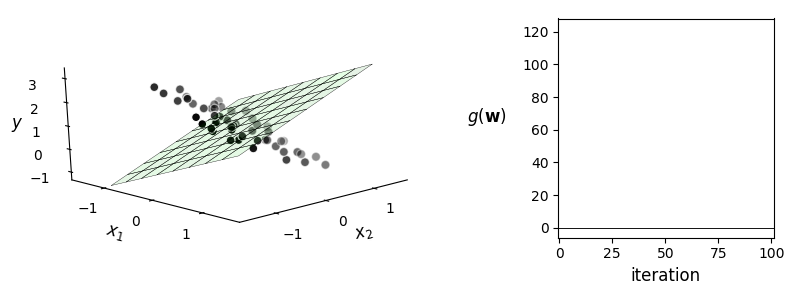
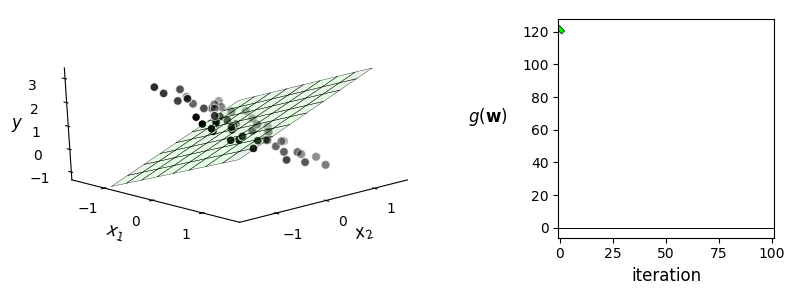
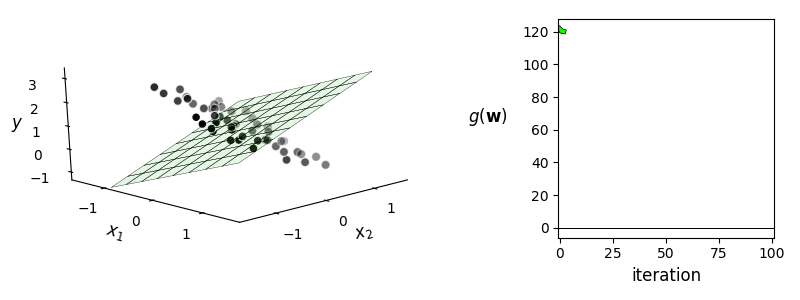
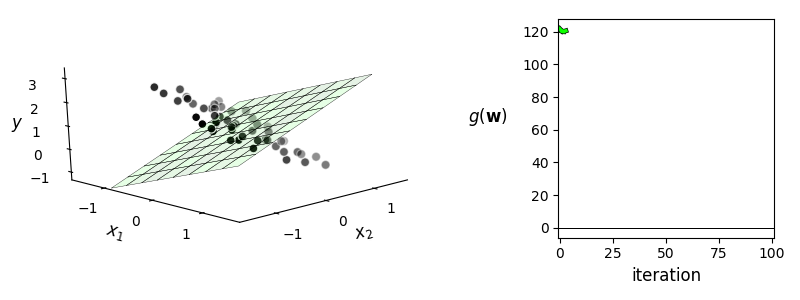
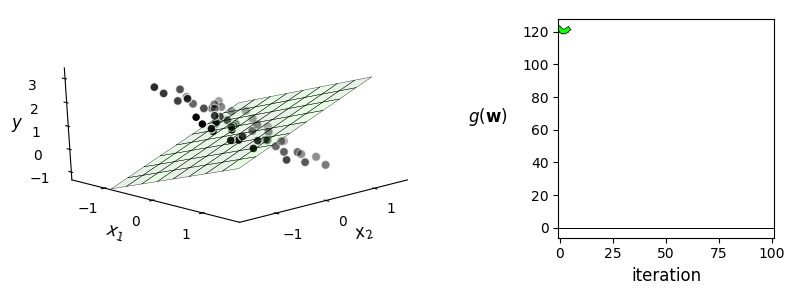
...
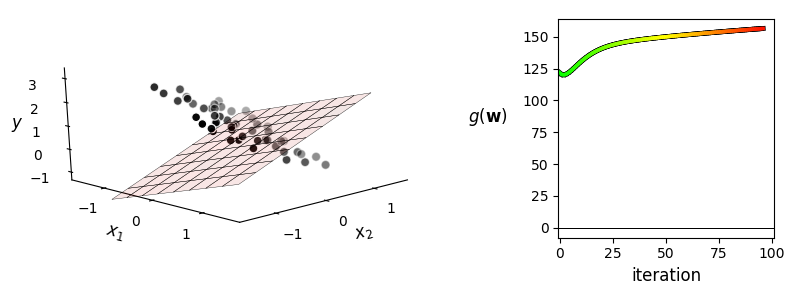
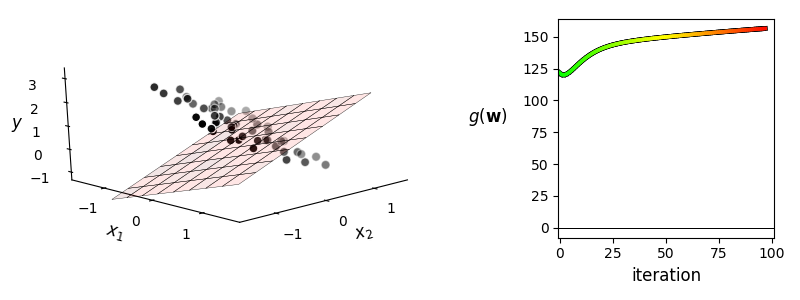
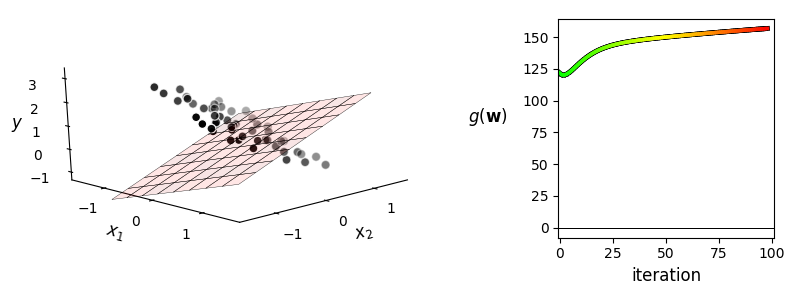
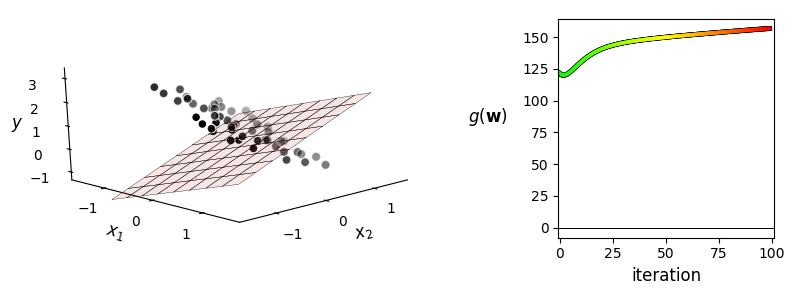
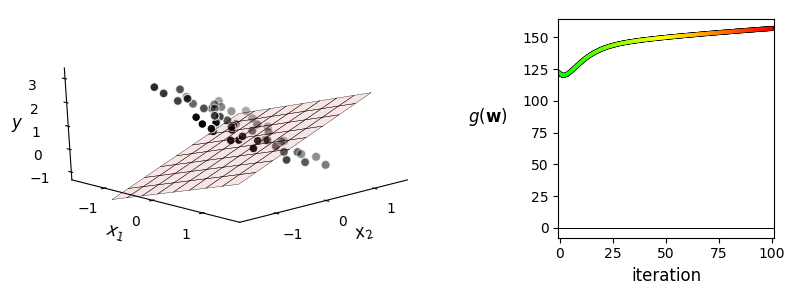

In [15]:
# animate descent process
demo2.animate_it_3d(w_hist,view = [10,-40],viewmax = 1.3)

## 1.4  The efficacy of a learned model

- nce we have successfully minimized the Least Squares cost the first way to measure the fit quality is the average fit to the training data

- this is called *mean squared error (or MSE)* and for optimal set of weights found as $w_0^{\star}$ and $\mathbf{w}^{\star}$ it is computed as

\begin{equation}
\text{MSE}=\frac{1}{P}\sum_{p=1}^{P}\left(w_0^{\star}+\mathbf{x}_{p}^{T}\mathbf{w}^{\star}-y_{p}^{\,}\right)^{2}
\end{equation}

## 1.5 Predicting the value of new input data

With optimal parameters $w_0^{\star}$ and $\mathbf{w}^{\star}$ we can predict the output $y_{\textrm{new}}$ of a new input feature $\mathbf{x}_{\textrm{new}}$

- we simply plug the new input into the tuned linear model and estimating the associated output as 

\begin{equation}
y_{\textrm{new}}^{\,}=w_0^{\star}+\mathbf{x}_{\textrm{new}}^{T}\mathbf{w}^{\star}
\end{equation}

<p><img src= '../../mlrefined_images/superlearn_images/Fig_3_5_new.png' width="50%" height="50%" alt=""/></p>

## 1.6 Linear regression from a probabilistic perspective

- we built our linear regression model on the fundamental assumption that the relationship between input and output variables is (approximately) linear, i.e., that $w_0+\mathbf{x}_{p}^T\mathbf{w} \approx y_{p}$. 

- denoting the difference between $y_p$ and $w_0+\mathbf{x}_{p}^T\mathbf{w}$ as $\varepsilon_p$, we can replace these *approximate* equalities with *exact* equalities of the form

\begin{equation}
w_0+\mathbf{x}_{p}^T\mathbf{w} +\varepsilon_p = y_{p} ,\quad p=1,...,P
\end{equation}

- here $\varepsilon_p$'s interpreted as error or noise in the data

With this new notation, the Least Squares cost for linear regression can be written, in terms of $\varepsilon_p$'s, as  

\begin{equation}
\,g\left(w_0,\mathbf{w}\right) = \sum_{p=1}^{P}\left(w_0^{\,}+\mathbf{x}_{p}^{T}\mathbf{w}^{\,}-y_{p}^{\,}\right)^{2} = \sum_{p=1}^{P} \varepsilon_p^2
\end{equation}

Put into words, with linear regression we aim to find the parameters $w_0$ and $\mathbf{w}$ that minimize the total squared noise

- how do we know what the noise (random) variables should be? - we do not know typically

- *assume* a distribution that allows us to recover $w_0$ and $\mathbf{w}$ effectively, commonly Gaussian

- i.e., assume $\left\{ \varepsilon_p \right\} _{p=1}^{P}$ are drawn from a zero-mean Gaussian distribution

#### <span style="color:#a50e3e;">Example 6: </span>  Global sea levels are rising!

- below we plot both the Least Squares trend line fit to a dataset [[1]](#bib_cell) consisting of satellite measurements of global mean sea level changes on earth from 1993 to 2014 (left panel), as well as the estimated noise distribution according to the learned trend line (right panel).   

<IPython.core.display.Javascript object>


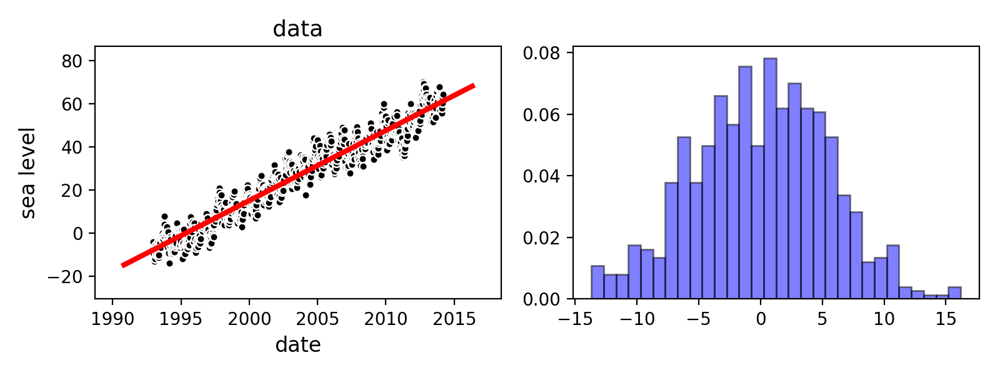

In [14]:
# load in dataset
datapath = '../../mlrefined_datasets/superlearn_datasets/climate_data.csv'
data = np.asarray(pd.read_csv(datapath,header = None))
demo1 = superlearn.regression_probabilistic_demos.visualizer(data)

# solve Least Squares 
demo1.run_algo(algo='newtons_method', w_init = np.random.randn(2,1), max_its = 1)

# visualize results
demo1.error_hist(num_bins=30, xlabel='date', ylabel='sea level', show_pdf='on')

- noise of fitted line looks rather Gaussian!

#### <span style="color:#a50e3e;">Example 7: </span> The relationship between the height of mother and the height of daughter 

- the Francis Galton's height dataset collected in 1885 in an attempt to explore the relationship between the heights of mothers and daughters

-we plot the Least Squares linear regression fit with data in left panel, noise of fit in right panel

<IPython.core.display.Javascript object>


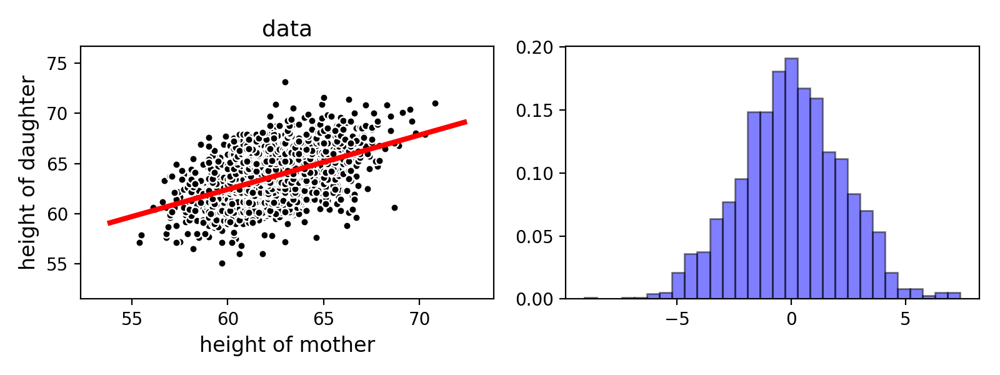

In [15]:
# load in dataset
datapath = '../../mlrefined_datasets/superlearn_datasets/mother_daughter.csv'
data = np.asarray(pd.read_csv(datapath,header = None))
demo2 = superlearn.regression_probabilistic_demos.visualizer(data)

# solve Least Squares
demo2.run_algo(algo='newtons_method', w_init = np.random.randn(2,1), max_its = 1)

# visualize results
demo2.error_hist(num_bins = 30, xlabel='height of mother', ylabel='height of daughter', show_pdf='on')

In [ ]:
- noise looks sort of Gaussian!

- In both examples as you can see it looks like that the noise does follow a zero-mean Gaussian distribution, and hence our assumption is not far-fetched.

### Statistical modeling

- since $\epsilon_p$ assumed Gaussian, so too is $y_p = w_0+\mathbf{x}_{p}^T\mathbf{w} +\varepsilon_p$ for all $p$, but what is mean and variance?

- in terms of data distribution we have for each point

\begin{equation}
{\cal P}\left(y=y_{p}\,|\,\mathbf{x}_{p},w_0,\mathbf{w}\right)=\frac{1}{\sqrt{2\pi}\,\sigma}e^{\,\frac{-1}{2\sigma^{2}}\left(y-\left(w_0+\mathbf{x}_{p}^{T}\mathbf{w}\right)\right)^{2}} ,\quad p=1,...,P
\end{equation}

- **assuming data is independent** we can form likelihood

- using the independence assumption we can write the likelihood as

\begin{equation}
{\cal L}=\prod_{p=1}^{P}{\cal P}\left(y=y_{p}\,|\,\mathbf{x}_{p},w_0,\mathbf{w}\right)
\end{equation}  

- since maximizing the likelihood is mathematically equivalent to minimizing its negative log-likelihood we have the probabilistic cost function

\begin{equation}
g\left(w_0,\mathbf{w},\sigma\right)=-\sum_{p=1}^{P}\text{log}\,{\cal P}\left(y=y_{p}\,|\,\mathbf{x}_{p},w_0,\mathbf{w}\right)
\end{equation}  

to be minimized over $w_0$, $\mathbf{w}$, and the noise standard deviation $\sigma$. 

Our first assumption on the distribution of noise makes it possible to write the exact form of $g$, with some algebra, as 

\begin{equation}
g\left(\widetilde{\mathbf{w}},\sigma\right)=P\,\text{log}\left(\sqrt{2\pi}\,\sigma\right)+\frac{1}{2\sigma^{2}}\sum_{p=1}^{P} \left(y_p-\widetilde{\mathbf{x}}_{p}^{T}\widetilde{\mathbf{w}}\right)^{2}
\end{equation}  

where we have used the notation 

\begin{equation}
\widetilde{\mathbf{w}}=\left[\begin{array}{c}
w_{0}\\
\mathbf{w}
\end{array}\right]
\,\,\,\,\text{and}\,\,\,\,\,
\widetilde{\mathbf{x}}_{p}=\left[\begin{array}{c}
1\\
\mathbf{x}_{p}
\end{array}\right]
\end{equation}

to write $g$ more compactly.

Checking the first order condition for optimality we have

$$
\begin{array}{c}
\nabla_{\widetilde{\mathbf{w}}}g\left(\widetilde{\mathbf{w}},\sigma\right)= \frac{1}{\sigma^{2}}\sum_{p=1}^{P} \mathbf{x}_p\left(y_p-\widetilde{\mathbf{x}}_{p}^{T}\widetilde{\mathbf{w}}\right)=\mathbf{0}\\
\frac{\partial}{\partial\sigma}g\left(\widetilde{\mathbf{w}},\sigma\right)= \frac{P}{\sigma}-\frac{1}{\sigma^{3}}\sum_{p=1}^{P} \left(y_p-\widetilde{\mathbf{x}}_{p}^{T}\widetilde{\mathbf{w}}\right)^{2}=0
\end{array}
$$

The first equation gives the linear system 

\begin{equation}
\left(\sum_{p=1}^{P} \widetilde{\mathbf{x}}_p^{\,}\widetilde{\mathbf{x}}_p^T \right) \widetilde{\mathbf{w}}_{\,}^{\,} =  \sum_{p=1}^{P} \widetilde{\mathbf{x}}_p^{\,} y_p^{\,}
\end{equation}


whose solution $\widetilde{\mathbf{w}}^\star$ can be used in the second equation to find the optimal value for the noise variance, as

\begin{equation}
\sigma^2 = \frac{1}{P}\sum_{p=1}^{P} \left(y_p-\widetilde{\mathbf{x}}_{p}^{T}\widetilde{\mathbf{w}}^{\star}\right)^{2}
\end{equation}

Note that the linear system characterizing the fit here is identical to what we derived previously in Subsection 1.3, where interestingly enough, we found the same solution through minimizing the Least Squares cost and without making any of the statistical assumptions made here.   

> The maximum likelihood solution derived here using the assumptions on noise distribution and independence of data is identical to the Least Squares solution derived previously from a geometric perspective.

Even though it was necessary to assume a Gaussian distribution on the noise in order to re-derive the Least Squares solution from a probabilistic perspective, in practice we can still use Least Squares on datasets where the noise distribution is not necessarily Gaussian.   

#### <span style="color:#a50e3e;">Example 8: </span> Least Squares and uniformly distributed noise

- below in left panel we create a simulated dataset with uniformly distributed noise and fit a Least Squares line to it as we did previously in Examples 6 and 7

- the Least Squares solution (left panel) still provides a good fit to the data even though the assumption of Gaussian distribution on noise is not met (right panel)

<IPython.core.display.Javascript object>


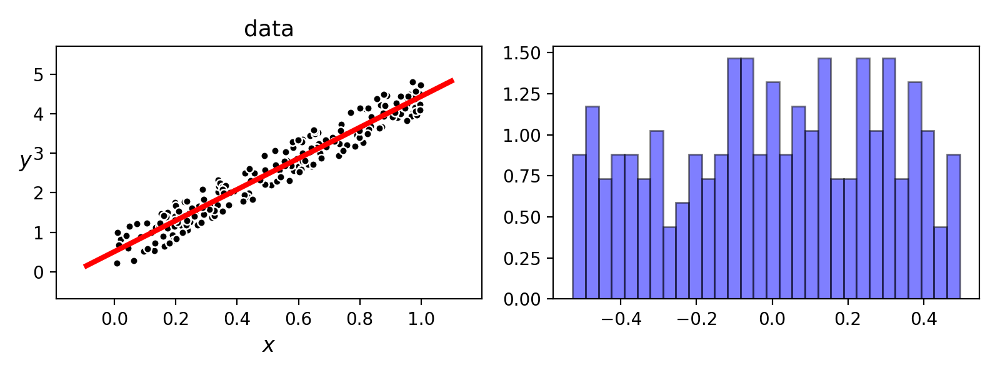

In [16]:
# make and load a simulated dataset with uniformly distributed noise
num_pts = 200
x = np.random.rand(num_pts)
y = 4*x + np.random.rand(num_pts) 
x.shape = (len(x),1)
y.shape = (len(y),1)
data = np.concatenate((x,y),axis = 1)
demo3 = superlearn.regression_probabilistic_demos.visualizer(data)

# solve Least Squares
demo3.run_algo(algo='newtons_method', w_init = np.random.randn(2,1), max_its = 1)

# visualize results
demo3.error_hist(num_bins = 30)

- this is now an unrealistic dataset, in practice we do not know what the noise distribution really is

<a id='bib_cell'></a>

### Data sources

[1] RS Nerem, DP Chambers, C Choe, and GT Mitchum. Estimating mean sea level change from the topex and jason altimeter missions. Marine Geodesy, 33(S1):435–446, 2010.

[2] Data taken from https://www.statcrunch.com/5.0/shareddata.php?keywords=Galton